  # PostProcessing
  This notebook is initially designed for PostProcessing ASETS-II numerical and experimental data.
  It can also be used for other configurations's numerical results. But if you want to compare with other experimental data with a different format than ASETS-II. You should find a way to read them to RTD and RTDt in this notebook.

In [11]:
] activate ..

  Activating project at `~/Documents/GitHub/ComputationalHeatTransfer.jl`


In [12]:
using ComputationalHeatTransfer
using Plots
using Interact

  # Read simulation data

In [14]:
read_path = "../numedata/solution-APSanim.jld2"
# read_path = "../numedata/solution-hc2300-f20.jld2"
SimuResult = load(read_path)["SimulationResult"];

  ### get time array

In [15]:
t = SimuResult.tube_hist_t;
t

301-element Vector{Any}:
 30.00000000001368
 30.010000000013694
 30.020000000013706
 30.030000000013718
 30.04000000001373
 30.050000000013743
 30.060000000013755
 30.070000000013767
 30.08000000001378
 30.09000000001379
 30.100000000013804
 30.110000000013816
 30.120000000013828
  ⋮
 32.89000000001405
 32.900000000014025
 32.910000000014
 32.92000000001398
 32.930000000013955
 32.94000000001393
 32.95000000001391
 32.960000000013885
 32.97000000001386
 32.98000000001384
 32.990000000013815
 33.00000000001379

  # Plot 2D graphs

  ### film and slug dynamics

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif")
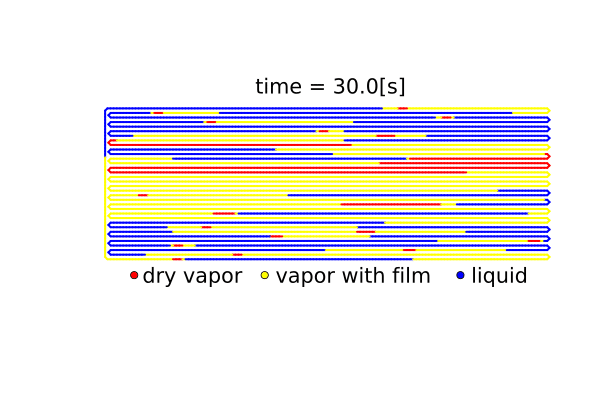

In [16]:
@gif for i in eachindex(t)
    plot(OHPSlug(),i,SimuResult)
end

  ### plate T [K]

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif")
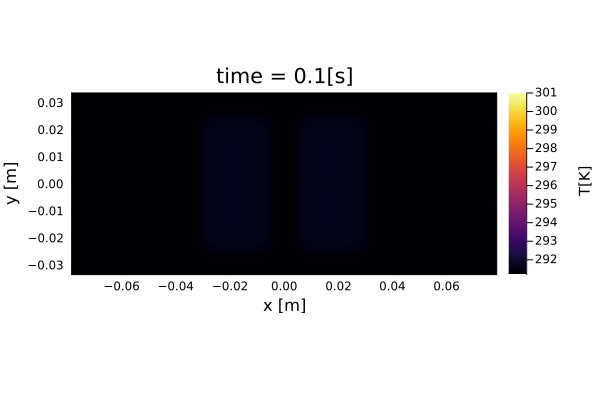

In [108]:
@gif for i in eachindex(t)
    plot(OHPTemp(),i,SimuResult,clim=(291.2,301.0))
end

  ### 2D superheat

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif")
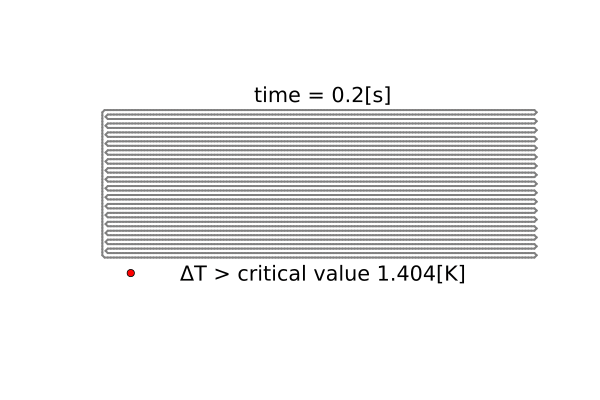

In [21]:
@gif for i in eachindex(t)
    plot(OHPSuper(),i,SimuResult)
end

  ### 2D pressure

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif")
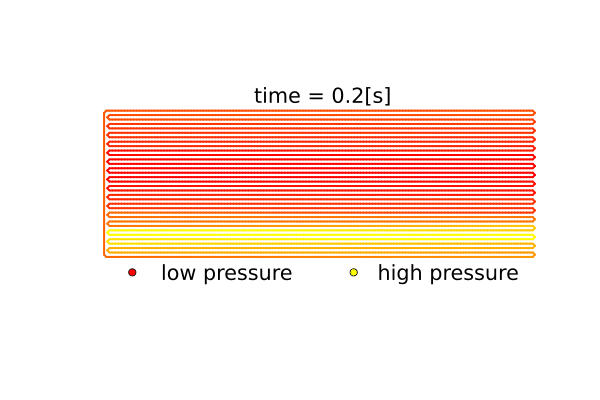

In [93]:
@gif for i in eachindex(t)
    plot(OHPPres(),i,SimuResult)
end

  # Plot 2D interpolated curves

  ### Interpolate 2D T data from the plate for fixed sensors on the plate

  place the 2D sensors

In [109]:
x2Dsensors = [-2.75,-1.4,-0.8,0.0,0.0,0.8,1.4,2.75] .* inches
y2Dsensors = [0.0,   0.0, 0.0,0.0,0.4,0.0,0.0,0.0] .* inches
plate_sensors = (x2Dsensors,y2Dsensors);

  get the curve

In [44]:
t_hist,g_hist = getTcurve(plate_sensors,SimuResult);

  ### Read experiment T data
  This part can be customized as long as you can get a matrix for RTD (sensor data) and an array for RTDt (time points)

In [30]:
import XLSX

 read experiment file for ASETS-II data.

In [12]:
expfile = expfileDict["O001_H001_P040"]
exppath = "../expdata/"
xf = XLSX.readxlsx(exppath*expfile);

  get experiment data for ASETS-II data

In [13]:
Onum, Hnum, power_exp = getconfig(expfile)
RTDt,RTD = getRTD(xf,Onum);

  ### 2D interpolated temperature curve at fixed sensors

In [14]:
RTD_for_plotting = [1,4,8];

plot OHP

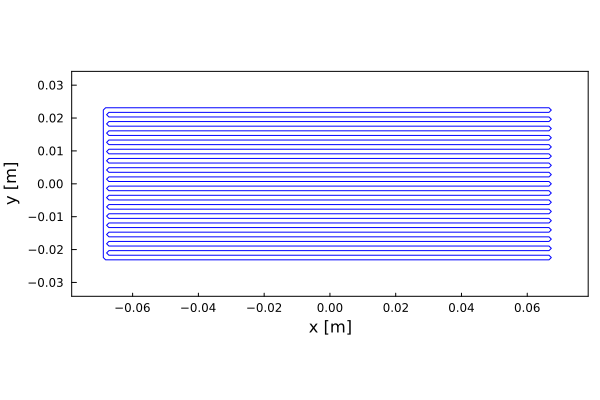

In [8]:
plot(OHP(),SimuResult)

plot sensors

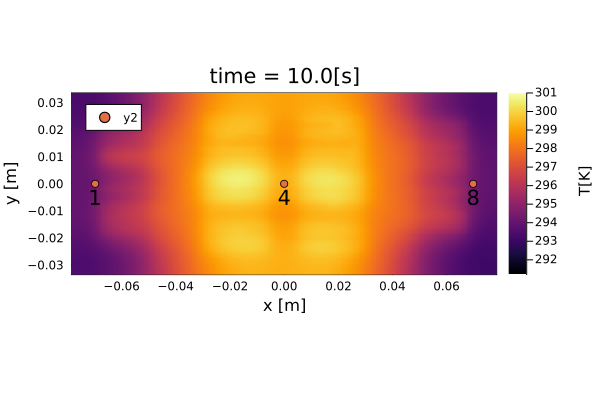

In [110]:
scatter!(x2Dsensors[RTD_for_plotting],y2Dsensors[RTD_for_plotting])
annotate!(x2Dsensors[RTD_for_plotting], y2Dsensors[RTD_for_plotting].-0.005, RTD_for_plotting)

plot temperature curve

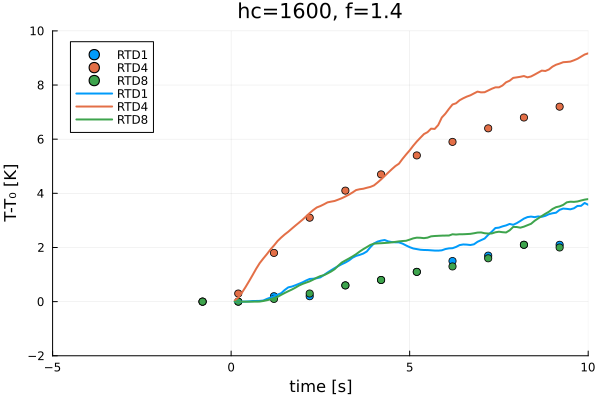

In [78]:
plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
plot!(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(-5,10),title="hc=1600, f=1.4")

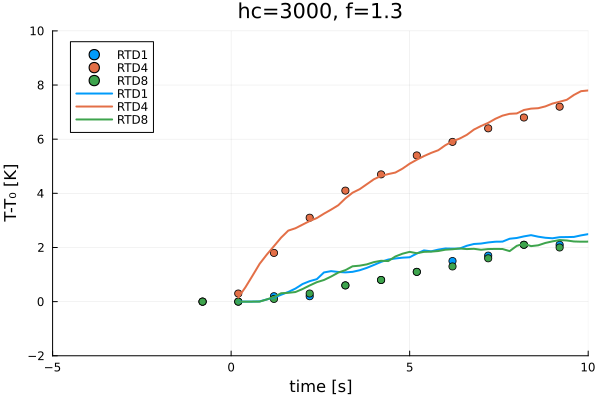

In [31]:
plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
plot!(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(-5,10),title="hc=3000, f=1.3")

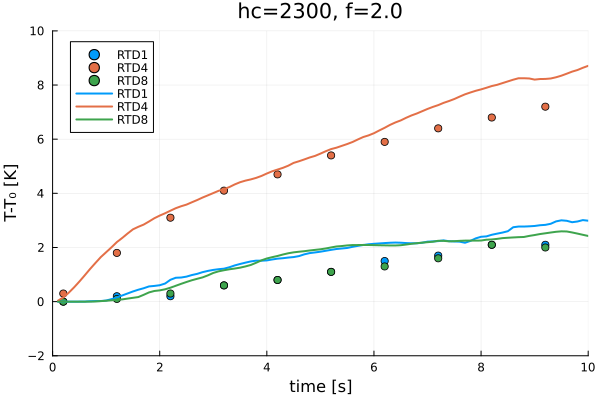

In [45]:
plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
plot!(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(0,10),title="hc=2300, f=2.0")

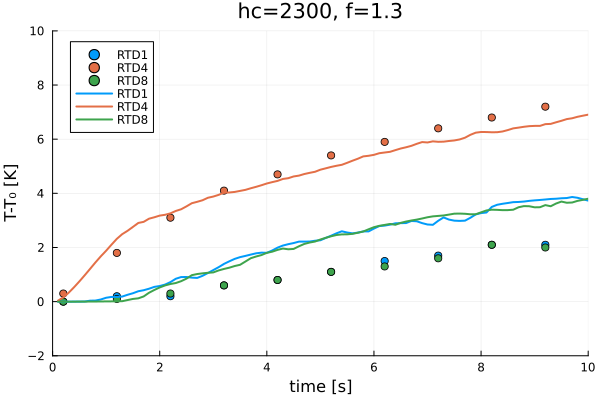

In [31]:
plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
plot!(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(0,10),title="hc=2300, f=1.3")

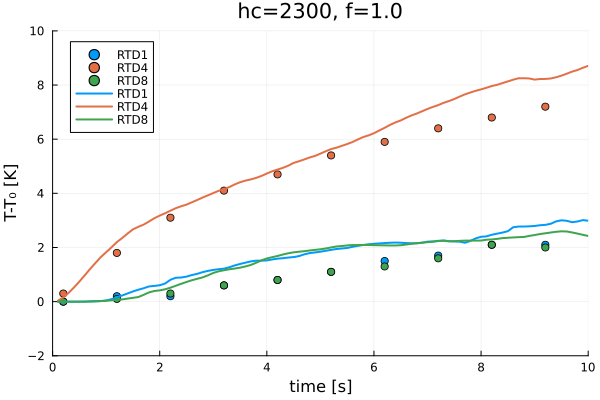

In [40]:
plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
plot!(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(0,10),title="hc=2300, f=1.0")

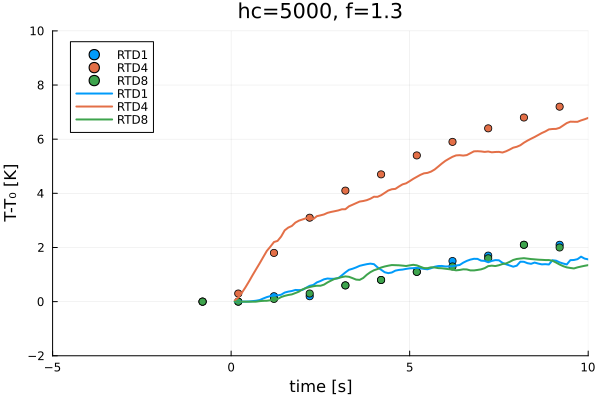

In [45]:
plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
plot!(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(-5,10),title="hc=5000, f=1.3")

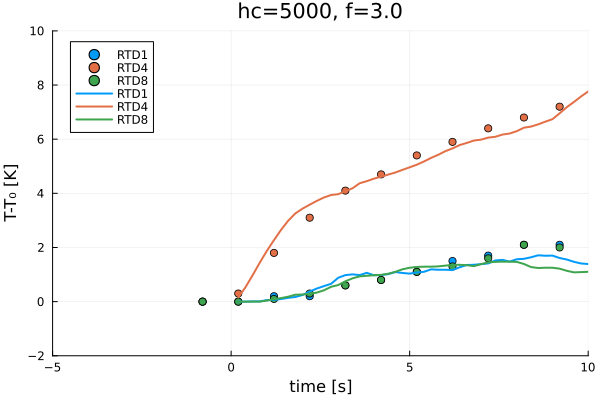

In [67]:
plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
plot!(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(-5,10),title="hc=5000, f=3.0")

  ### 2D interpolated thermal conductance

In [27]:
ihot = 4 # hot sensor  for calculating thermal conductance
icold = 8 # cold sensor  for calculating thermal conductance;

8

plot them separately

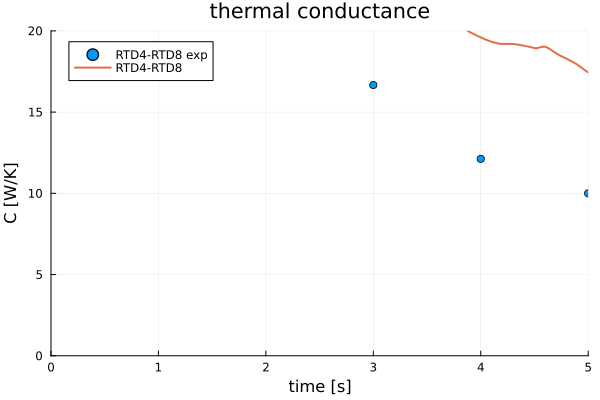

In [18]:
plot(OHPCond(),(ihot,icold),(t_hist,g_hist),(RTDt,RTD),SimuResult)

  ### Liquid slug velocity statistics

fix title and ylabel and legend

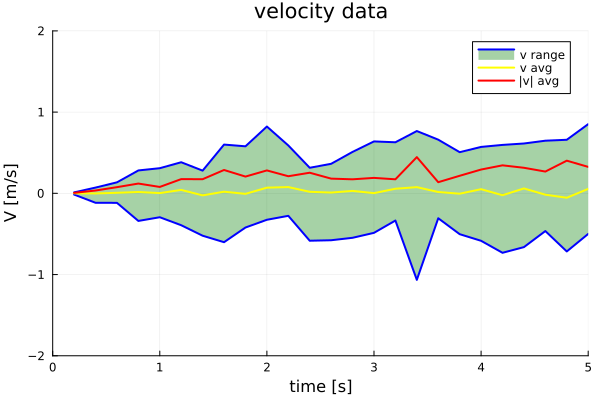

In [23]:
plot(OHPV(), SimuResult::SimulationResult,ylimit=(-2,2))

  # Plot 1D interpolated curves

In [20]:
@manipulate for i in 1:1:length(t)
    plot(OHP1DT(),i,SimuResult,xlim=(1,2))
    plot!(twinx(),OHPTwall(),i,SimuResult,xlim=(1,2))
#     plot!(twinx(),OHP1DΔT(),i,SimuResult,xlim=(1,2))
#     plot!(twinx(),OHP1DP(),i,SimuResult,xlim=(1,2))
end

WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Scope(WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["i"], Dict{Symbol, Any}(:className => "interact ", :style => Dict{Any, Any}(:padding => "5px 10px 0px 10px")))], Dict{Symbol, Any}(:className => "interact-flex-row-left")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol, Any}(:max => 500, :min => 1, :attributes => Dict{Any, Any}(:type => "range", Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}", "orient" => "horizontal"), :step => 1, :className => "slider slider is-fullwidth", :style => Dict{Any, Any}()))], Dict{Symbol, Any}(:className => "interact-flex-row-center")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol, Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol, Any}(:className => "interact-flex-row-right"))], Dict{Symbol, Any}(:className => "interact-flex-row interact-widget")), Dict{String, Tuple{Observables.AbstractObservable, Union{Nothing, Bool}}}("changes" => (Observable(0), nothing), "index" => (Observable{Any}(250), nothing)), Set{String}(), nothing, WebIO.Asset[WebIO.Asset("js", "knockout", "/Users/yuxuanli/.julia/packages/Knockout/HReiN/src/../assets/knockout.js"), WebIO.Asset("js", "knockout_punches", "/Users/yuxuanli/.julia/packages/Knockout/HReiN/src/../assets/knockout_punches.js"), WebIO.Asset("js", nothing, "/Users/yuxuanli/.julia/packages/InteractBase/Qhvxg/src/../assets/all.js"), WebIO.Asset("css", nothing, "/Users/yuxuanli/.julia/packages/InteractBase/Qhvxg/src/../assets/style.css"), WebIO.Asset("css", nothing, "/Users/yuxuanli/.julia/packages/Interact/PENUy/src/../assets/bulma.min.css")], Dict{Any, Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{WebIO.AbstractConnection}(), Condition(Base.InvasiveLinkedList{Task}(Task (runnable) @0x000000011a6e5a50, Task (runnable) @0x000000011a6e5a50), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context,\n            );\n        }\n    };\n    var json_data = {\"formatted_vals\":[\"1\",\"2\",\"3\",\"4\",\"5\",\"6\",\"7\",\"8\",\"9\",\"10\",\"11\",\"12\",\"13\",\"14\",\"15\",\"16\",\"17\",\"18\",\"19\",\"20\",\"21\",\"22\",\"23\",\"24\",\"25\",\"26\",\"27\",\"28\",\"29\",\"30\",\"31\",\"32\",\"33\",

  ### 1D sensor selector

In [21]:
L = SimuResult.integrator_tube.p.tube.L
@manipulate for ξ in 0:1e-3:L
    plot(OHP(),SimuResult) # plot the ohp layout

    xprobe,yprobe = oneDtwoDtransform(ξ,SimuResult)
    scatter!([xprobe],[yprobe])
end

┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{Number, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = oneDtwoDtransform(ξ::Float64, sr::ComputationalHeatTransfer.SimulationResult) at Postprocessing.jl:263
└ @ ComputationalHeatTransfer ~/Documents/GitHub/ComputationalHeatTransfer.jl/src/intube/Postprocessing.jl:263
┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{Number, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = oneDtwoDtransform(ξ::Float64, sr::ComputationalHeatTransfer.SimulationResult) at Postprocessing.jl:264
└ @ ComputationalHeatTransfer ~/Documents/GitHub/ComputationalHeatTransfer.jl/src/intube/Postprocessing.jl:264


WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Scope(WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["ξ"], Dict{Symbol, Any}(:className => "interact ", :style => Dict{Any, Any}(:padding => "5px 10px 0px 10px")))], Dict{Symbol, Any}(:className => "interact-flex-row-left")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol, Any}(:max => 4651, :min => 1, :attributes => Dict{Any, Any}(:type => "range", Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}", "orient" => "horizontal"), :step => 1, :className => "slider slider is-fullwidth", :style => Dict{Any, Any}()))], Dict{Symbol, Any}(:className => "interact-flex-row-center")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol, Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol, Any}(:className => "interact-flex-row-right"))], Dict{Symbol, Any}(:className => "interact-flex-row interact-widget")), Dict{String, Tuple{Observables.AbstractObservable, Union{Nothing, Bool}}}("changes" => (Observable(0), nothing), "index" => (Observable{Any}(2326), nothing)), Set{String}(), nothing, WebIO.Asset[WebIO.Asset("js", "knockout", "/Users/yuxuanli/.julia/packages/Knockout/HReiN/src/../assets/knockout.js"), WebIO.Asset("js", "knockout_punches", "/Users/yuxuanli/.julia/packages/Knockout/HReiN/src/../assets/knockout_punches.js"), WebIO.Asset("js", nothing, "/Users/yuxuanli/.julia/packages/InteractBase/Qhvxg/src/../assets/all.js"), WebIO.Asset("css", nothing, "/Users/yuxuanli/.julia/packages/InteractBase/Qhvxg/src/../assets/style.css"), WebIO.Asset("css", nothing, "/Users/yuxuanli/.julia/packages/Interact/PENUy/src/../assets/bulma.min.css")], Dict{Any, Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{WebIO.AbstractConnection}(), Condition(Base.InvasiveLinkedList{Task}(Task (runnable) @0x00000001a5650e80, Task (runnable) @0x00000001a5650e80), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context,\n            );\n        }\n    };\n    var json_data = {\"formatted_vals\":[\"0.0\",\"0.001\",\"0.002\",\"0.003\",\"0.004\",\"0.005\",\"0.006\",\"0.007\",\"0.008\",\"0.009\",\"0.01\",\"0.011\",\"0.012\",\"0.013\",\"0.014\",\"0.015\",\"0.016\",\"0.017\",\"0.018\",\"0.019\",\"0.02\",\"0.021\",\"0.

  # Plot 1D property curve for a fixed location sensor

┌ Warning: `getindex(itp::AbstractInterpolation{T, N}, i::Vararg{ExpandedIndexTypes, N}) where {T, N}` is deprecated, use `itp(i...)` instead.
│   caller = get1DTandP(xsensors::Vector{Float64}, SimuResult::ComputationalHeatTransfer.SimulationResult) at Postprocessing.jl:310
└ @ ComputationalHeatTransfer ~/Documents/GitHub/ComputationalHeatTransfer.jl/src/intube/Postprocessing.jl:310


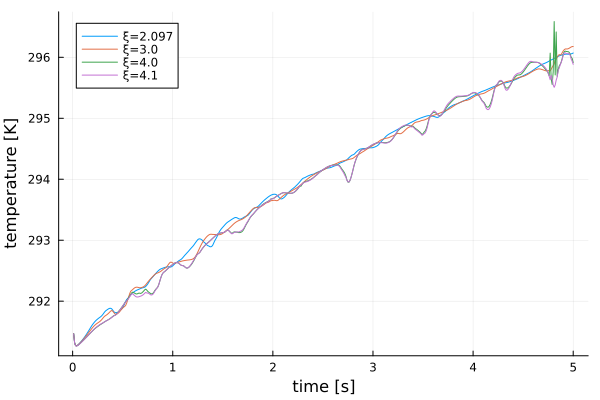

In [22]:
xsensors1D = [2.097, 3.0, 4,4.1]

θhist1D,phist1D = get1DTandP(xsensors1D, SimuResult);

plot(t,θhist1D,label=string.("ξ=", xsensors1D'),xlabel="time [s]", ylabel="temperature [K]")

  ### get boiling data (if there are any)

In [20]:
if length(SimuResult.boil_hist) != 0
boil_data,boil_num_x,boil_num_t,t_boil,x2D_boil,y2D_boil,boil_dt = get_boil_matrix(SimuResult::SimulationResult);
end

([19.0 1.0000000000000007; 21.0 1.0000000000000007; … ; 246.0 4.569999999999861; 21.0 4.889999999999968], [0.0; 0.0; … ; 0.0; 0.0;;], [0.0; 0.0; … ; 0.0; 1.0;;], 0.1:0.1:4.9, [-0.0621564551969971, -0.03779673902197789, 0.0005844910729714686, 0.002001110358633734, 0.029842866512102377, 0.04669106120299924, 0.049479964867125914, 0.04772053962998274, 0.015028430075386514, -0.0025884694555914772  …  0.05537193588393576, 0.047234432354137934, 0.01052467560405827, 0.0078687402742037, -0.010156634653746055, -0.019755192429118232, -0.038699262027626025, -0.04338078558947874, -0.068915, -0.068915], [-0.023125, -0.023125, -0.023125, -0.023125, -0.023125, -0.023125, -0.023124999999999996, -0.021723484848484846, -0.021723484848484843, -0.02172348484848484  …  0.023125000000000277, 0.023125000000000277, 0.023125000000000277, 0.023125000000000277, 0.023125000000000284, 0.02312500000000029, 0.02312500000000029, 0.02312500000000029, 0.0031808730053697687, -0.01634730324178525], 0.1)

boiling frequency scatter graph (if there are any)

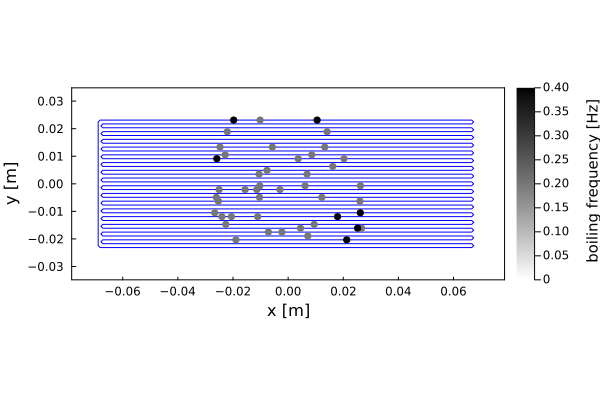

In [21]:
plt = plot()
if length(SimuResult.boil_hist) != 0
plt = plot(OHP(),SimuResult)
scatter!(x2D_boil,y2D_boil,
    colorbar=true,markeralpha=delta.(boil_num_x),colorbar_title="\n boiling frequency [Hz]",right_margin=3Plots.mm,marker_z=boil_num_x./SimuResult.tube_hist_t[end],markerstrokewidth=0,markercolor=cgrad(:greys, rev = true))
end
plt

boiling frequency curve (if there are any)

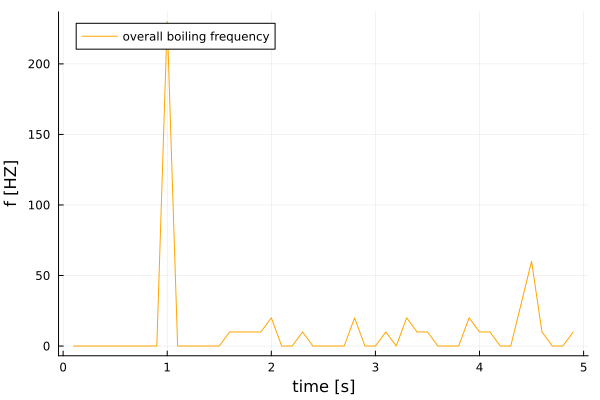

In [22]:
plt = plot()
if length(SimuResult.boil_hist) != 0
plt = plot(t_boil,boil_num_t./boil_dt,
color=:orange, legend=:topleft, ylabel="f [HZ]",xlabel="time [s]", label="overall boiling frequency")
end
plt

In [89]:
OHPtype = "ASETS-II OHP 1 LARGE HEATER"
power = 40 # total heater power in watts
Tc = 291.2; # condenser temperature
eparams,cparams = OHPConfiguration(OHPtype,power,Tc,0.001,hc=1600.0);
# eparams,cparams = OHPConfiguration(OHPtype,power,Tc,Δx,hc=2300.0);

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif")
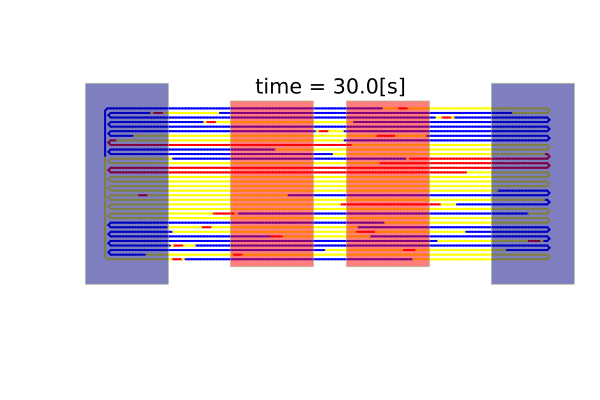

In [103]:
@gif for i in eachindex(t)
    plot(OHPSlug(),i,SimuResult,plain=true)

# plot heaters (red)
for ep in eparams
    plot!(ep)
end

# plot condensers (blue)
for cp in cparams
    plot!(cp)
end
end
# show plot
# plt

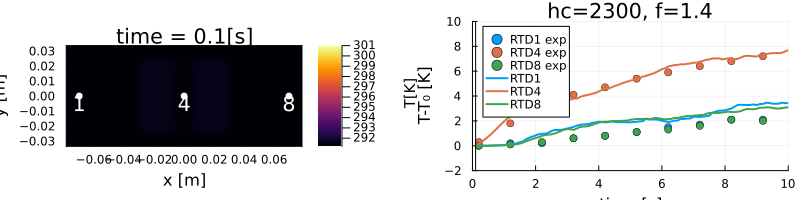

In [161]:
l = @layout [a  b]
    p1 =  plot(OHPTemp(),i,SimuResult,clim=(291.2,301.0))
    scatter!(p1,x2Dsensors[RTD_for_plotting],y2Dsensors[RTD_for_plotting],markercolor=:white)
    annotate!(p1,x2Dsensors[RTD_for_plotting], y2Dsensors[RTD_for_plotting].-0.005, RTD_for_plotting,:white,legend=false)

    p2 = plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
    plot!(p2,OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(0,10),title="hc=2300, f=1.4")
    plot!(p2,[t[i],t[i]],[-10,10],color=:black,labels="",legend=:topleft)

plot(p1, p2, layout = l, size=(800,200))

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif")
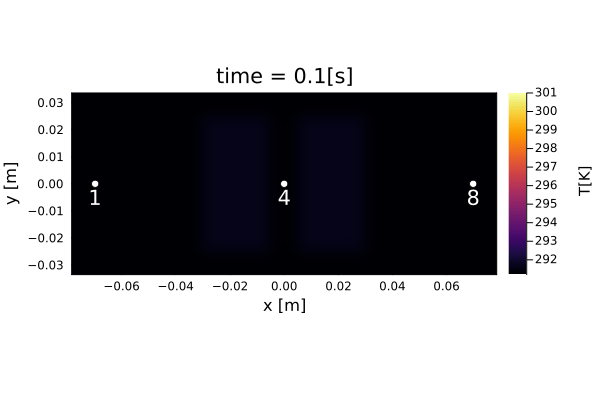

In [162]:
@gif for i in eachindex(t)
    plot(OHPTemp(),i,SimuResult,clim=(291.2,301.0))

    scatter!(x2Dsensors[RTD_for_plotting],y2Dsensors[RTD_for_plotting],markercolor=:white)
annotate!(x2Dsensors[RTD_for_plotting], y2Dsensors[RTD_for_plotting].-0.005, RTD_for_plotting,:white,legend=false)
end

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/ComputationalHeatTransfer.jl/examples/tmp.gif")
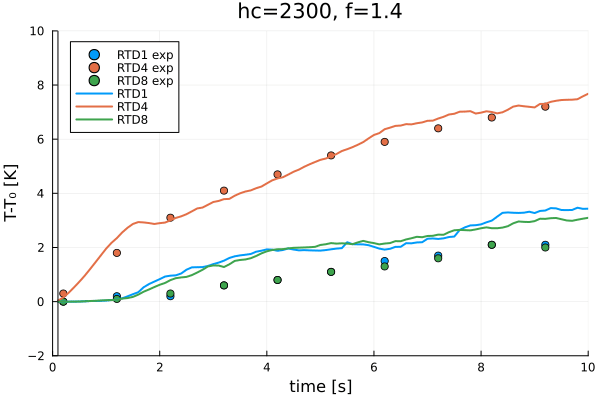

In [163]:
@gif for i in eachindex(t)
    plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
    plot!(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(0,10),title="hc=2300, f=1.4")
    plot!([t[i],t[i]],[-10,10],color=:black,labels="",legend=:topleft)
end

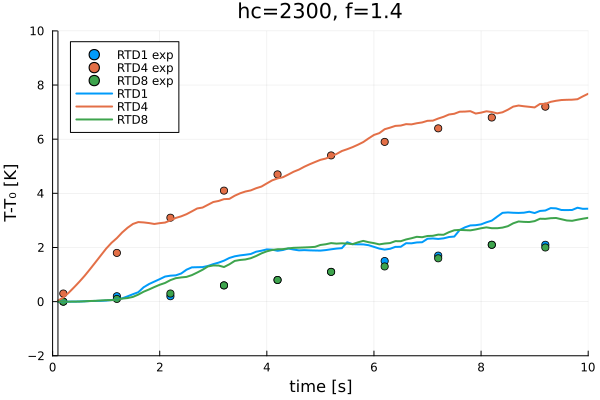

In [141]:
t
plot(OHPTexp() ,RTD_for_plotting,(RTDt.-0.8,RTD)     ,SimuResult)
plot!(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,ylim=(-2,10),xlim=(0,10),title="hc=2300, f=1.4")
plot!([t[i],t[i]],[-10,10],color=:black,labels="",legend=:topleft)

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*